## This data science project aims to predict possibility of road accident and its severity. This will help road users to decide on a journey and driving habit.  The dataset contains various details like severity, collision type, injuries, fatality, location, etc. 

In [15]:
import pandas as pd
import numpy as np

### About dataset

This dataset is about past road accident and severity. The __data_collisions.csv__ data set includes details of 194672 accident records, location of accident and severity. It includes some of the following fields:

| Field          | Description                                                                           |
|----------------|---------------------------------------------------------------------------------------|
| Location       | location of collision                                                                 |
| Severity       | Code the correspond to the severity of the collision                                  |
| severity Desc  | A detailed description of the severity of the collision                               | 
| Ped count      | The number of pedestrians                                                             |
| SeriousInjuries| The number of serious injuries in the collision                                       |
| Injuries       | The number of total injuries in the collision                                         |
| Fatalities     | The number of fatalities in the collision                                             |
| Weather        | Wseather condition during the time of the collision                                   |
| COLLISIONTYPE  | collision type                                                                        |
| PERSONCOUNT    |The total number of people involved in the collision                                   |
| PEDCYLCOUNT    | The number of bicycles involved in the collision. This is entered by the state.       | 
| VEHCOUNT       | The number of vehicles involved in the collision.This is entered by the state.        |
| INCDATE        | The date of the incident                                                              |
| INCDTTM        | The date and time of the incident.                                                    |
| JUNCTIONTYPE   | Category of junction at which collision took place                                    |
| SDOT_COLCODE   | A code given to the collision by SDOT.                                                |
| SDOT_COLDESC   | A description of the collision corresponding to the collision code.                   |
| INATTENTIONIND | Whether or not collision was due to inattention. (Y/N                                 |
| UNDERINFL      | Whether or not a driver involved was under the influence of drugs or alcohol.         | 
| ROADCOND       | The condition of the road during the collision.                                       |
| LIGHTCOND      | The light conditions during the collision.                                            |
| PEDROWNOTGRNT  | Whether or not the pedestrian right of way was not granted. (Y/N)                     |
| SPEEDING       | Whether or not speeding was a factor in the collision. (Y/N)                          |
| CROSSWALKKEY   | A key for the crosswalk at which the collision occurred.                              |

### Load data from CSV File

In [16]:
df=pd.read_csv("Data-Collisions.csv", parse_dates=["INCDATE"])
#df.info()
df.head()


C:\Users\ogunn\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3049: DtypeWarning: Columns (33) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,2,-122.323148,47.703140,1,1307,1307,3502005,Matched,Intersection,37475.0,...,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
1,1,-122.347294,47.647172,2,52200,52200,2607959,Matched,Block,NaN,...,Wet,Dark - Street Lights On,NaN,6354039.0,NaN,11,From same direction - both going straight - bo...,0,0,N
2,1,-122.334540,47.607871,3,26700,26700,1482393,Matched,Block,NaN,...,Dry,Daylight,NaN,4323031.0,NaN,32,One parked--one moving,0,0,N
3,1,-122.334803,47.604803,4,1144,1144,3503937,Matched,Block,NaN,...,Dry,Daylight,NaN,NaN,NaN,23,From same direction - all others,0,0,N
4,2,-122.306426,47.545739,5,17700,17700,1807429,Matched,Intersection,34387.0,...,Wet,Daylight,NaN,4028032.0,NaN,10,Entering at angle,0,0,N


In [17]:
df.describe()

,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,INTKEY,SEVERITYCODE.1,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,SDOT_COLCODE,SDOTCOLNUM,SEGLANEKEY,CROSSWALKKEY
count,194673.000000,189339.000000,189339.000000,194673.000000,194673.000000,194673.000000,65070.000000,194673.000000,194673.000000,194673.000000,194673.000000,194673.000000,194673.000000,1.149360e+05,194673.000000,1.946730e+05
mean,1.298901,-122.330518,47.619543,108479.364930,141091.456350,141298.811381,37558.450576,1.298901,2.444427,0.037139,0.028391,1.920780,13.867768,7.972521e+06,269.401114,9.782452e+03
std,0.457778,0.029976,0.056157,62649.722558,86634.402737,86986.542110,51745.990273,0.457778,1.345929,0.198150,0.167413,0.631047,6.868755,2.553533e+06,3315.776055,7.226926e+04
min,1.000000,-122.419091,47.495573,1.000000,1001.000000,1001.000000,23807.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.007024e+06,0.000000,0.000000e+00
25%,1.000000,-122.348673,47.575956,54267.000000,70383.000000,70383.000000,28667.000000,1.000000,2.000000,0.000000,0.000000,2.000000,11.000000,6.040015e+06,0.000000,0.000000e+00
50%,1.000000,-122.330224,47.615369,106912.000000,123363.000000,123363.000000,29973.000000,1.000000,2.000000,0.000000,0.000000,2.000000,13.000000,8.023022e+06,0.000000,0.000000e+00
75%,2.000000,-122.311937,47.663664,162272.000000,203319.000000,203459.000000,33973.000000,2.000000,3.000000,0.000000,0.000000,2.000000,14.000000,1.015501e+07,0.000000,0.000000e+00
max,2.000000,-122.238949,47.734142,219547.000000,331454.000000,332954.000000,757580.000000,2.000000,81.000000,6.000000,2.000000,12.000000,69.000000,1.307202e+07,525241.000000,5.239700e+06


initial obeservation shows that the data is imbalance. the maximum non-null column count is 194673 while the non-null column is 4667

In [18]:
severity=df['SEVERITYCODE'].value_counts()
severity

1    136485
2     58188
Name: SEVERITYCODE, dtype: int64

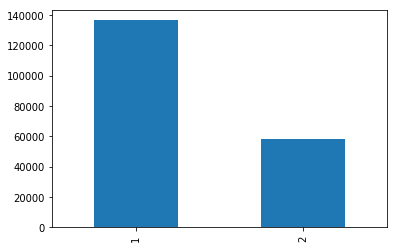

In [19]:
severity.plot(kind='bar')

In [20]:
cordinate=df.groupby(['X','Y']).size().rename('count').reset_index()
cordinate=pd.DataFrame(cordinate)
cordinate.head()

,X,Y,count
0,-122.419091,47.575133,1
1,-122.419032,47.575956,14
2,-122.418973,47.576779,1
3,-122.418757,47.660709,1
4,-122.418615,47.574866,8


In [21]:
cordinate['count']=cordinate['count'].astype(float)
cordinate.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23884 entries, 0 to 23883
Data columns (total 3 columns):
X        23884 non-null float64
Y        23884 non-null float64
count    23884 non-null float64
dtypes: float64(3)
memory usage: 559.9 KB


In [22]:
cordinate.isnull().sum()

X        0
Y        0
count    0
dtype: int64

In [23]:
import folium
#itertools.repeat(float(price)

In [13]:
#conda install -c conda-forge shapely
from folium import plugins
import itertools
#Using Seattle's latitude and longitude 
latitude = 47.608013 
longitude = -122.335167


seattle_map = folium.Map(location = [latitude, longitude], zoom_start = 12)

incidents = plugins.MarkerCluster().add_to(seattle_map)

for lat, lng, label in zip(cordinate.Y, cordinate.X, itertools.repeat(cordinate.count)):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=folium.Popup(label),
    ).add_to(incidents)

seattle_map

In [28]:
Addtype=pd.DataFrame(df['ADDRTYPE'].value_counts())
Addtype

,ADDRTYPE
Block,126926
Intersection,65070
Alley,751


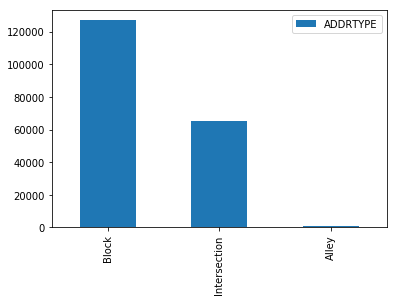

In [29]:
import matplotlib.pyplot as plt
%matplotlib inline

Addtype.plot.bar()

#### Number of accident that occured over the year period.

In [11]:
df['year']=pd.to_datetime(df['INCDATE'], unit='ms').dt.year

In [12]:
accident_year=df['year'].value_counts()
accident_year=pd.DataFrame(accident_year)
accident_year.sort_index(inplace=True)
accident_year.columns=['Accident']

accident_year.head()

,Accident
2004,11865
2005,15115
2006,15188
2007,14456
2008,13660


Text(0.5, 1.0, 'Number of accident yearly')

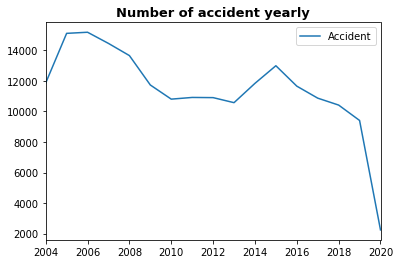

In [13]:
accident_year.plot.line()
plt.title('Number of accident yearly',weight='bold',fontsize=13)


In [14]:
import matplotlib.pyplot as plt 
from datetime import datetime as dt
%matplotlib inline

#### Drop column with 75% null values

In [15]:
df.isnull().sum()

SEVERITYCODE           0
X                   5334
Y                   5334
OBJECTID               0
INCKEY                 0
COLDETKEY              0
REPORTNO               0
STATUS                 0
ADDRTYPE            1926
INTKEY            129603
LOCATION            2677
EXCEPTRSNCODE     109862
EXCEPTRSNDESC     189035
SEVERITYCODE.1         0
SEVERITYDESC           0
COLLISIONTYPE       4904
PERSONCOUNT            0
PEDCOUNT               0
PEDCYLCOUNT            0
VEHCOUNT               0
INCDATE                0
INCDTTM                0
JUNCTIONTYPE        6329
SDOT_COLCODE           0
SDOT_COLDESC           0
INATTENTIONIND    164868
UNDERINFL           4884
WEATHER             5081
ROADCOND            5012
LIGHTCOND           5170
PEDROWNOTGRNT     190006
SDOTCOLNUM         79737
SPEEDING          185340
ST_COLCODE            18
ST_COLDESC          4904
SEGLANEKEY             0
CROSSWALKKEY           0
HITPARKEDCAR           0
year                   0
dtype: int64

In [16]:
null_col=["STATUS","INCKEY","COLDETKEY","X","Y","INCDATE","INCDTTM","COLLISIONTYPE", "PERSONCOUNT", "PEDCYLCOUNT", "VEHCOUNT","SEVERITYCODE.1","JUNCTIONTYPE","SEVERITYDESC","SEGLANEKEY","ST_COLDESC","SDOT_COLDESC","LOCATION","REPORTNO","OBJECTID","INTKEY","EXCEPTRSNDESC","EXCEPTRSNCODE","INATTENTIONIND","SPEEDING","PEDROWNOTGRNT", "SDOTCOLNUM"]

In [17]:
df2=df.drop(null_col, axis=1)
df2.head()

,SEVERITYCODE,ADDRTYPE,PEDCOUNT,SDOT_COLCODE,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,ST_COLCODE,CROSSWALKKEY,HITPARKEDCAR,year
0,2,Intersection,0,11,N,Overcast,Wet,Daylight,10,0,N,2013
1,1,Block,0,16,0,Raining,Wet,Dark - Street Lights On,11,0,N,2006
2,1,Block,0,14,0,Overcast,Dry,Daylight,32,0,N,2004
3,1,Block,0,11,N,Clear,Dry,Daylight,23,0,N,2013
4,2,Intersection,0,11,0,Raining,Wet,Daylight,10,0,N,2004


In [18]:
df2.dropna(inplace=True)
df2.isnull().sum()

SEVERITYCODE    0
ADDRTYPE        0
PEDCOUNT        0
SDOT_COLCODE    0
UNDERINFL       0
WEATHER         0
ROADCOND        0
LIGHTCOND       0
ST_COLCODE      0
CROSSWALKKEY    0
HITPARKEDCAR    0
year            0
dtype: int64

In [19]:
df2.shape

(187507, 12)

In [20]:
df2["ADDRTYPE"].value_counts()

Block           123317
Intersection     63448
Alley              742
Name: ADDRTYPE, dtype: int64

In [21]:
df2["ADDRTYPE"].replace(to_replace=['Block','Intersection','Alley'], value=[0,1,2],inplace=True)

In [22]:
df2["HITPARKEDCAR"].value_counts()

N    180865
Y      6642
Name: HITPARKEDCAR, dtype: int64

In [23]:
df2["HITPARKEDCAR"].replace(to_replace=['Y','N'], value=[1,0],inplace=True)


In [24]:
df2['UNDERINFL'].value_counts()

N    98734
0    79706
Y     5075
1     3992
Name: UNDERINFL, dtype: int64

In [25]:
df2["UNDERINFL"].replace(to_replace=['Y','N'], value=[1,0],inplace=True)


In [26]:
df2.head()

,SEVERITYCODE,ADDRTYPE,PEDCOUNT,SDOT_COLCODE,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,ST_COLCODE,CROSSWALKKEY,HITPARKEDCAR,year
0,2,1,0,11,0,Overcast,Wet,Daylight,10,0,0,2013
1,1,0,0,16,0,Raining,Wet,Dark - Street Lights On,11,0,0,2006
2,1,0,0,14,0,Overcast,Dry,Daylight,32,0,0,2004
3,1,0,0,11,0,Clear,Dry,Daylight,23,0,0,2013
4,2,1,0,11,0,Raining,Wet,Daylight,10,0,0,2004


In [27]:
df2['ROADCOND'].value_counts()

Dry               123731
Wet                47213
Unknown            14007
Ice                 1192
Snow/Slush           992
Other                124
Standing Water       111
Sand/Mud/Dirt         73
Oil                   64
Name: ROADCOND, dtype: int64

In [28]:
Feature=df2[['ADDRTYPE','PEDCOUNT','CROSSWALKKEY','HITPARKEDCAR']]
Feature=pd.concat([Feature, pd.get_dummies(df2[['LIGHTCOND','WEATHER','ROADCOND']])], axis=1)

Feature.head()


### Feature selection

In [29]:
X=np.asarray(Feature)
X[0:5]

array([[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
        0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=int64)

In [30]:
y=np.asarray(df2['SEVERITYCODE'])
y[0:5]

array([2, 1, 1, 1, 2], dtype=int64)

### Normalize Data

In [31]:
from sklearn import preprocessing

In [32]:
X=preprocessing.StandardScaler().fit(X).transform(X)
X[0:2]

### Data splitting

In [33]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (150005, 33) (150005,)
Test set: (37502, 33) (37502,)


## Logistic Regression 

In [34]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
LR = LogisticRegression(C=0.01, solver='liblinear').fit(X_train,y_train)
LR

LogisticRegression(C=0.01, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='liblinear',
          tol=0.0001, verbose=0, warm_start=False)

### Predict

In [35]:
yhat = LR.predict(X_test)
yhat[0:5]

array([1, 1, 1, 1, 1], dtype=int64)

In [36]:
yhat_prob = LR.predict_proba(X_test)
yhat_prob[0:5]

array([[0.71310476, 0.28689524],
       [0.6774332 , 0.3225668 ],
       [0.72179256, 0.27820744],
       [0.72179256, 0.27820744],
       [0.70907092, 0.29092908]])

In [37]:
from sklearn.metrics import jaccard_similarity_score
jaccard_similarity_score(y_test, yhat)

0.7128953122500133

### SVM

In [ ]:
from sklearn import svm
clf = svm.SVC(kernel='linear')
clf.fit(X_train, y_train) 

In [ ]:
yhat = clf.predict(X_test)
yhat [0:5]

In [ ]:
from sklearn.metrics import f1_score
f1_score(y_test, yhat, average='weighted') 